# MODULES

In [267]:
!pip install pathlib
!pip install matplotlib
!pip install plotly
!pip install jupyterlab "ipywidgets>=7.6" "plotly>=5.0.0"

In [268]:
!nvidia-smi

Thu Sep 11 13:35:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.169                Driver Version: 570.169        CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce MX330           Off |   00000000:2C:00.0 Off |                  N/A |
| N/A   51C    P8            N/A  / 5001W |       7MiB /   2048MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [269]:
import torch
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.get_device_name(0))

1.13.1+cu117
11.7
NVIDIA GeForce MX330


In [270]:
import os
import cv2
import math
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# GLOBAL VARIABLES

In [272]:
# ROOT_DIR_IMAGES = '../SampleSet/Dino/dino_1_25'
ROOT_DIR_IMAGES = "../SampleSet/MVS Data/scan6_max_1_5"

# CAMERA

In [273]:
class SimplePinholeCamera:
    def __init__(self, f=None, cx=None, cy=None):
        self.f = f
        self.cx = cx
        self.cy = cy

    def K(self):
        """Return intrinsic calibration matrix."""
        return np.array([
            [self.f,    0, self.cx],
            [0,    self.f, self.cy],
            [0,        0,       1]
        ], dtype=np.float64)

    def __repr__(self):
        return f"<SimplePinholeCamera f={self.f:.2f}, cx={self.cx:.2f}, cy={self.cy:.2f}>"

# IMAGES

In [274]:
class ImageMisc:
    @classmethod
    def get_paths(cls, root_dir, filter='*'):
        paths = []
        for path in pathlib.Path(root_dir).glob(filter):
            paths.append(str(path))
        paths = sorted(paths)
        return paths
    
    @classmethod
    def load_images(cls, paths):
        images = []
        for path in paths:
            img_bgr = cv2.imread(path)          # Load as BGR
            if img_bgr is None:
                continue  # skip if image not found or unreadable
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)  # Convert to RGB
            images.append(img_rgb)
        return images

    @classmethod
    def to_grayscale(cls, image):
        if image.ndim == 2:  # already grayscale
            return image
        else:  # RGB to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            return gray

In [275]:
class _SuperImage:
    def set_imag(self, imag):
        self.imag = imag
        return self

    def set_imag_gray(self, imag_gray):
        self.imag_gray = imag_gray
        return self

    def set_kpts_dess(self, kpts, dess):
        self.kpts = kpts
        self.dess = dess
        return self

    def generate_imag_with_kpts(self, circle_color=(0, 255, 0), circle_thickness=2, line_thickness=2):
        imag = self.imag.copy()

        for kpt in self.kpts:
            x, y = int(kpt.pt[0]), int(kpt.pt[1])
            radius = int(kpt.size / 2)
    
            # Draw circle
            cv2.circle(imag, (x, y), radius, circle_color, thickness=circle_thickness)
    
            # Draw orientation line
            angle_rad = math.radians(kpt.angle)
            x2 = int(x + radius * math.cos(angle_rad))
            y2 = int(y + radius * math.sin(angle_rad))
            cv2.line(imag, (x, y), (x2, y2), circle_color, thickness=line_thickness)
    
        self.imag_kpts = imag
        return imag


class SuperImage(_SuperImage):
    def __init__(self):
        self.imag = None
        self.imag_gray = None
        self.kpts = None
        self.dess = None
        self.imag_kpts = None

In [341]:
import cv2
import numpy as np

class SuperImagePair():
    def __init__(self, simga1, simga2, K):
        self.simag1 = simga1
        self.simag2 = simga2
        self.matcher = None
        self.matches = None
        self.good_matches = None
        self.inlier_matches = None
        self.inlier_pose_matches = None
        self.F = None
        self.E = None
        self.R = None
        self.t = None
        self.K = K

        
    def match(self, kind, ratio_thresh=0.50):
        if kind == 'brute-force':
            self._match_brute_force(ratio_thresh=0.50)

    
    def _match_brute_force(self, ratio_thresh=0.50):
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        des1 = self.simag1.dess
        des2 = self.simag2.dess

        matches = bf.knnMatch(des1, des2, k=2)  # lista de listas
        good_matches = []
        
        for pair in matches:
            if len(pair) < 2:
                continue
            m, n = pair
            if m.distance < ratio_thresh * n.distance:
                good_matches.append(m)  

        self.matcher = bf
        self.matches = matches
        self.good_matches = good_matches

    
    def estimate_fundamental_matrix(self):
        good_matches = self.good_matches
        kpts1 = self.simag1.kpts
        kpts2 = self.simag2.kpts
        
        if good_matches is None:
            print('Must run "match" method first.')
            return
        
        if len(good_matches) >= 8:  # 8 é mínimo para a 8-point algorithm
            pts1 = np.float32([kpts1[m.queryIdx].pt for m in good_matches])
            pts2 = np.float32([kpts2[m.trainIdx].pt for m in good_matches])
        
            F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, 1.0, 0.99)
            if F is None:
                print("Fundamental matrix não encontrada")
            else:
                inlier_count = int(mask.sum())
                ratio = inlier_count / len(good_matches)
                print("Good matches: {:06d}, Inlier matches (RANSAC): {:06d}, Ratio: {:.6f}".format(
                    len(good_matches), inlier_count, ratio))
                
                print("Fundamental matrix F:")
                for row in F:
                    formatted_row = ["{:13.6e}".format(val) for val in row]
                    print("  [" + " ".join(formatted_row) + "]")
                
                inlier_matches = [gm for gm, m in zip(good_matches, mask.ravel()) if m == 1]
    
                self.F = F
                self.inlier_matches = inlier_matches
    
        else:
            print("Poucos matches bons — não dá pra estimar F com segurança.")

    
    def estimate_essential_matrix(self):
        if self.F is None:
            print("Fundamental matrix must be estimated first.")
            return None
        if self.K is None:
            print("Camera intrinsics K not provided.")
            return None
        
        self.E = self.K.T @ self.F @ self.K
        print("Essential matrix E:")
        for row in self.E:
            formatted_row = ["{:13.6e}".format(val) for val in row]
            print("  [" + " ".join(formatted_row) + "]")
        
    
    def normalize_essential_matrix(self):
        if self.E is None:
            print("Essential matrix not estimated yet.")
            return None
    
        U, S, Vt = np.linalg.svd(self.E)
        sigma = (S[0] + S[1]) / 2.0
        S_normalized = np.diag([sigma, sigma, 0])
        E_norm = U @ S_normalized @ Vt
    
        # Normalize so that Frobenius norm = 1 (or max element = 1)
        E_norm /= np.linalg.norm(E_norm)
    
        self.E = E_norm
    
        print("Normalized Essential matrix E:")
        for row in self.E:
            formatted_row = ["{:13.6e}".format(val) for val in row]
            print("  [" + " ".join(formatted_row) + "]")


    
    def estimate_pose(self):
        if self.E is None:
            print("Essential matrix must be estimated first.")
            return None, None
        if self.inlier_matches is None:
            print("Need inlier matches from F estimation.")
            return None, None
    
        kpts1 = self.simag1.kpts
        kpts2 = self.simag2.kpts
        pts1 = np.float32([kpts1[m.queryIdx].pt for m in self.inlier_matches])
        pts2 = np.float32([kpts2[m.trainIdx].pt for m in self.inlier_matches])
    
        _, R, t, mask = cv2.recoverPose(self.E, pts1, pts2, self.K)
        self.R = R
        self.t = t
    
        # Correctly handle mask (OpenCV may return 1 or 255 for inliers)
        mask = mask.ravel() > 0
        self.inlier_pose_matches = [m for m, inlier in zip(self.inlier_matches, mask) if inlier]
    
        print("Recovered Pose:")
        print("Rotation R:\n", R)
        print("Translation t:\n", t.ravel())
        print("Inlier matches after pose filtering: {:06d} / {:06d}, Ratio: {:.6f}".format(
            len(self.inlier_pose_matches), len(self.inlier_matches),
            len(self.inlier_pose_matches)/len(self.inlier_matches)
        ))


    def get_essential_singular_values(self):
        if self.E is None:
            print("Essential matrix not estimated yet.")
            return None
        
        U, S, Vt = np.linalg.svd(self.E)
        
        print("Singular values of the Essential matrix E:")
        print(S)
        
        # For an ideal essential matrix, the singular values should be (a, a, 0)
        if len(S) == 3:
            print("Deviation from ideal E singular values (σ1 ≈ σ2, σ3 ≈ 0):")
            print("σ1 - σ2 = {:.6e}, σ3 = {:.6e}".format(S[0] - S[1], S[2]))


    # ---- all your other methods remain unchanged ----
    def generate_imag_with_matches(self, match_kind, max_matches=0):
        if match_kind == 'good-matches':
            matches = self.good_matches
        elif match_kind == 'inlier-matches':
            matches = self.inlier_matches
        elif match_kind == 'inlier-pose-matches':
            matches = self.inlier_pose_matches
        else:
            print('match_kind in {good-matches, inlier-matches}')
        
        imag1 = self.simag1.imag
        kpts1 = self.simag1.kpts
        imag2 = self.simag2.imag
        kpts2 = self.simag2.kpts

        if max_matches:
            matches = matches[:max_matches]
            
        imag_matches = cv2.drawMatches(
            imag1, kpts1,
            imag2, kpts2,
            matches, None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        return imag_matches
    
            
    def generate_imag_with_epilines(self, max_epipolars=0):
        pts1 = np.float32([self.simag1.kpts[m.queryIdx].pt for m in self.inlier_pose_matches])
        pts2 = np.float32([self.simag2.kpts[m.trainIdx].pt for m in self.inlier_pose_matches])
        
        pts1 = pts1.reshape(-1, 1, 2)
        pts2 = pts2.reshape(-1, 1, 2)
    
        if max_epipolars and len(pts1) > max_epipolars:
            idxs = np.linspace(0, len(pts1)-1, max_epipolars, dtype=int)
            pts1 = pts1[idxs]
            pts2 = pts2[idxs]
    
        F = self.F
        
        lines2 = cv2.computeCorrespondEpilines(pts1, 1, F)
        lines2 = lines2.reshape(-1, 3)
    
        lines1 = cv2.computeCorrespondEpilines(pts2, 2, F)
        lines1 = lines1.reshape(-1, 3)
    
        imag1 = self.simag1.imag.copy()
        imag2 = self.simag2.imag.copy()
    
        for r, pt1 in zip(lines1, pts1):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [imag1.shape[1], -(r[2] + r[0] * imag1.shape[1]) / r[1]])
            cv2.line(imag1, (x0, y0), (x1, y1), color, 1)
            cv2.circle(imag1, tuple(pt1[0].astype(int)), 5, color, -1)
    
        for r, pt2 in zip(lines2, pts2):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [imag2.shape[1], -(r[2] + r[0] * imag2.shape[1]) / r[1]])
            cv2.line(imag2, (x0, y0), (x1, y1), color, 1)
            cv2.circle(imag2, tuple(pt2[0].astype(int)), 5, color, -1)
    
        return imag1, imag2

    
    def evaluate_fundamental_quality(self):
        if self.F is None or self.inlier_matches is None:
            print("Fundamental matrix not estimated yet.")
            return None

        kpts1 = self.simag1.kpts
        kpts2 = self.simag2.kpts

        pts1 = np.float32([kpts1[m.queryIdx].pt for m in self.inlier_matches])
        pts2 = np.float32([kpts2[m.trainIdx].pt for m in self.inlier_matches])

        pts1_h = np.hstack([pts1, np.ones((pts1.shape[0], 1))])
        pts2_h = np.hstack([pts2, np.ones((pts2.shape[0], 1))])

        F = self.F

        errors = []
        sampson_errors = []
        for p1, p2 in zip(pts1_h, pts2_h):
            err = abs(p2 @ F @ p1)
            errors.append(err)

            Fx1 = F @ p1
            Ftx2 = F.T @ p2
            denom = Fx1[0]**2 + Fx1[1]**2 + Ftx2[0]**2 + Ftx2[1]**2
            if denom > 1e-12:
                sampson = (err**2) / denom
                sampson_errors.append(sampson)

        mean_err = np.mean(errors)
        mean_sampson = np.mean(sampson_errors) if sampson_errors else float("inf")

        print(f"Mean algebraic error: {mean_err:.6e}")
        print(f"Mean Sampson distance: {mean_sampson:.6e}")
        print(f"Number of inliers evaluated: {len(errors)}")

        return {
            "mean_error": mean_err,
            "mean_sampson": mean_sampson,
            "n_inliers": len(errors)
        }

In [342]:
class Plot:
    @classmethod    
    def plot_images_grid(cls, images, nrows=1, ncols=1, figsize=(12, 8)):
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        axes = axes.flatten()  # make it 1D for easy iteration

        for ax, img in zip(axes, images):
            if img.ndim == 2:  # grayscale
                ax.imshow(img, cmap="gray")
            else:  # RGB
                ax.imshow(img)
            ax.axis("off")

        for ax in axes[len(images):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()

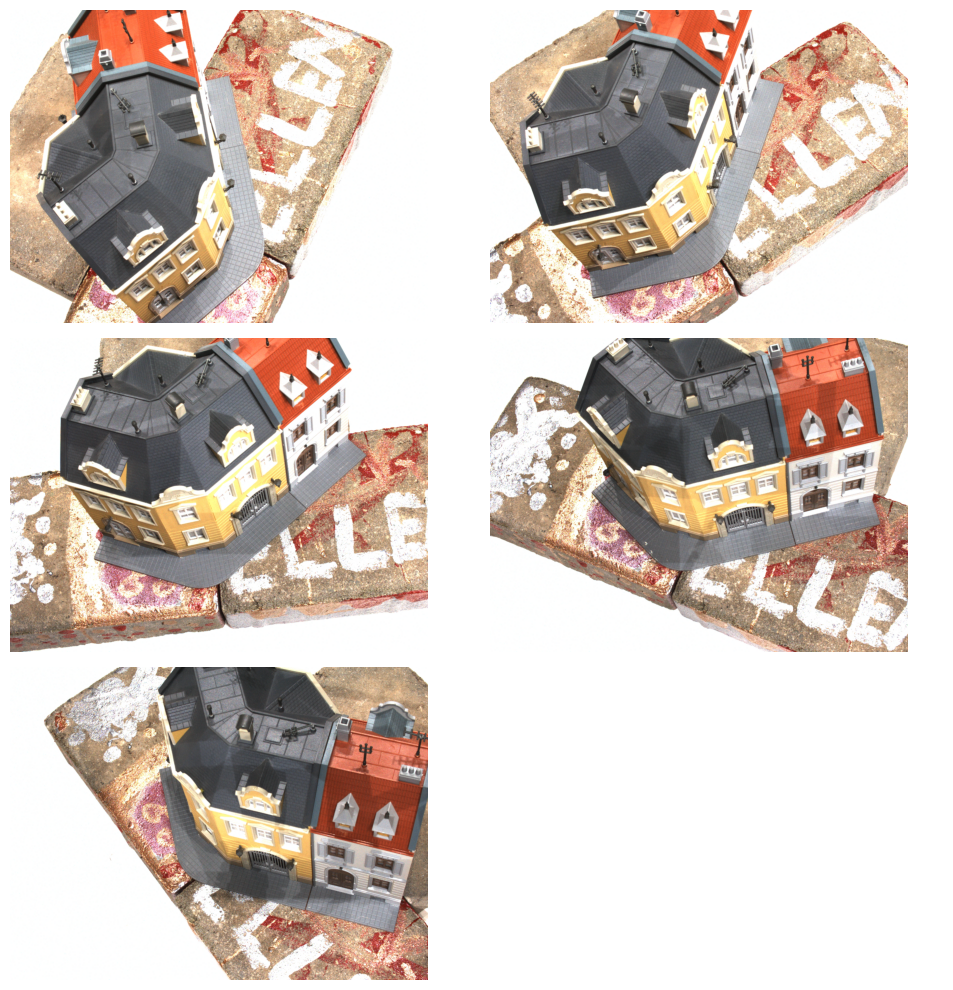

In [343]:
paths = ImageMisc.get_paths(ROOT_DIR_IMAGES)
imags = ImageMisc.load_images(paths)
# imags = [cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE) for img in imags]
Plot.plot_images_grid(imags, 3,2, (10,10))

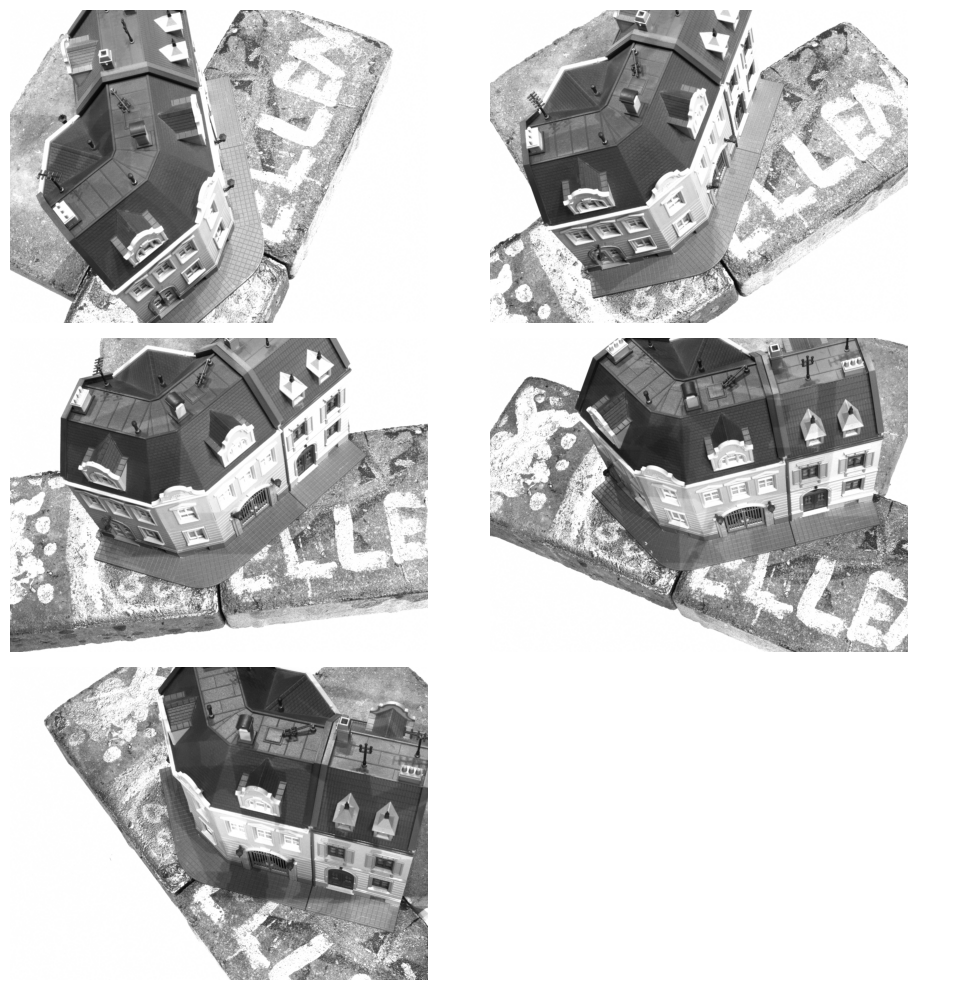

In [344]:
imags_gray = list(map(ImageMisc.to_grayscale, imags))
Plot.plot_images_grid(imags_gray, 3,2, (10,10))

In [345]:
shape = imags_gray[0].shape
h, w = shape
# f = max(h,w)
f = 1920
cx = w/2
cy = h/2
CAMERA = SimplePinholeCamera(f, cx, cy)
CAMERA

<SimplePinholeCamera f=1920.00, cx=800.00, cy=600.00>

# FEATURE DETECTOR

In [346]:
class FeatureDetector:
  def __init__(self, kind):
      allowed = ['sift', 'orb']
      if kind not in allowed:
        raise ValueError(f"Unsupported feature detector: {kind}. Allowed: {allowed}")

      if kind == 'sift':
        self.detector = cv2.SIFT_create()
      elif kind == 'orb':
        self.detector = cv2.ORB_create()


  def detect(self, image_gray):
      kpts, dess = self.detector.detectAndCompute(image_gray, None)
      return kpts, dess

In [347]:
FD = FeatureDetector(kind='sift')
SIMAGs = []
imags_kpts = []
for imag, imag_gray in zip(imags, imags_gray):
    kpts, dess = FD.detect(imag_gray)
    simag = SuperImage().set_imag(imag).set_imag_gray(imag_gray).set_kpts_dess(kpts, dess)
    imag_kpts = simag.generate_imag_with_kpts(circle_color=(0, 255, 0), circle_thickness=2, line_thickness=2)
    imags_kpts.append(imag_kpts)
    SIMAGs.append(simag)
    

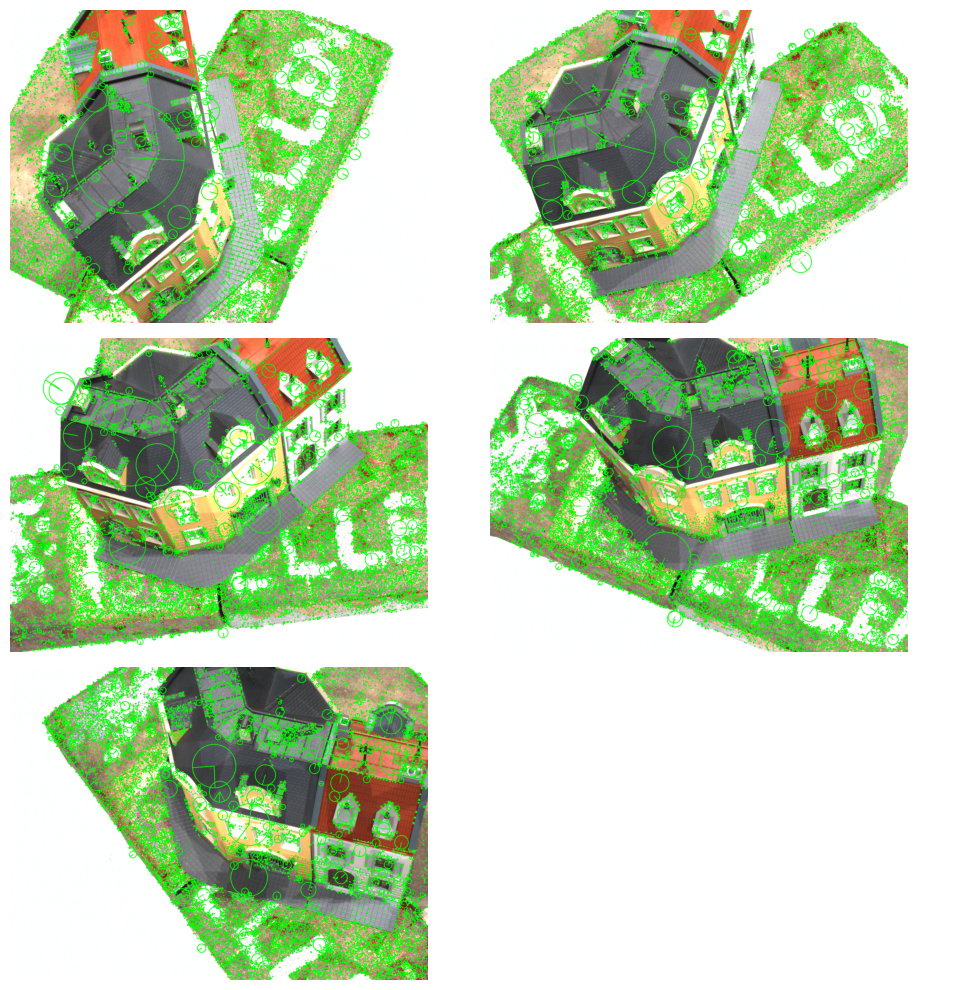

In [348]:
Plot.plot_images_grid(imags_kpts, 3,2, (10,10))

# IMAGES PAIRS

In [349]:
SIMAGPs = []
for simag1, simag2 in zip(SIMAGs[:-1], SIMAGs[1:]):
    simagp = SuperImagePair(simag1, simag2, CAMERA.K())
    SIMAGPs.append(simagp)

## Match points

In [350]:
imag_matchs = []
imag_inliers = []
imag_pose_inliers = []
imag_epipolars = []
fund_qualities = []
for simagp in SIMAGPs:
    simagp.match(kind='brute-force')
    
    simagp.estimate_fundamental_matrix()

    simagp.estimate_essential_matrix()

    simagp.normalize_essential_matrix()   # <-- normalize before pose
    
    simagp.estimate_pose()

    fund_qualities.append(
        simagp.evaluate_fundamental_quality()
    )

    imag_matchs.append(
        simagp.generate_imag_with_matches(match_kind='good-matches')
    )
    imag_inliers.append(
        simagp.generate_imag_with_matches(match_kind='inlier-matches')
    )

    imag_pose_inliers.append(
        simagp.generate_imag_with_matches(match_kind='inlier-pose-matches')
    )
    
    imag_epipolars.append(
        simagp.generate_imag_with_epilines(max_epipolars=100)
    )

Good matches: 001314, Inlier matches (RANSAC): 001226, Ratio: 0.933029
Fundamental matrix F:
  [ 4.528350e-07  8.740176e-07 -1.028557e-03]
  [-9.045280e-07  5.526357e-07  1.473564e-03]
  [-2.534098e-04 -2.168227e-03  1.000000e+00]
Essential matrix E:
  [ 1.669331e+00  3.221979e+00 -2.724071e-01]
  [-3.334452e+00  2.037236e+00  2.076524e+00]
  [-8.330084e-01 -2.183869e+00  3.174658e-02]
Normalized Essential matrix E:
  [ 2.883283e-01  5.204327e-01 -5.357387e-02]
  [-5.424020e-01  3.053274e-01  3.330665e-01]
  [-1.461574e-01 -3.511372e-01  1.136451e-02]
Recovered Pose:
Rotation R:
 [[ 0.87553797 -0.47743708  0.07407503]
 [ 0.48007621  0.87694826 -0.02210376]
 [-0.05440682  0.05491434  0.99700768]]
Translation t:
 [-0.53506355 -0.05730587 -0.84286597]
Inlier matches after pose filtering: 000808 / 001226, Ratio: 0.659054
Mean algebraic error: 2.276038e-04
Mean Sampson distance: 6.198414e-02
Number of inliers evaluated: 1226
Good matches: 000618, Inlier matches (RANSAC): 000570, Ratio: 0.92

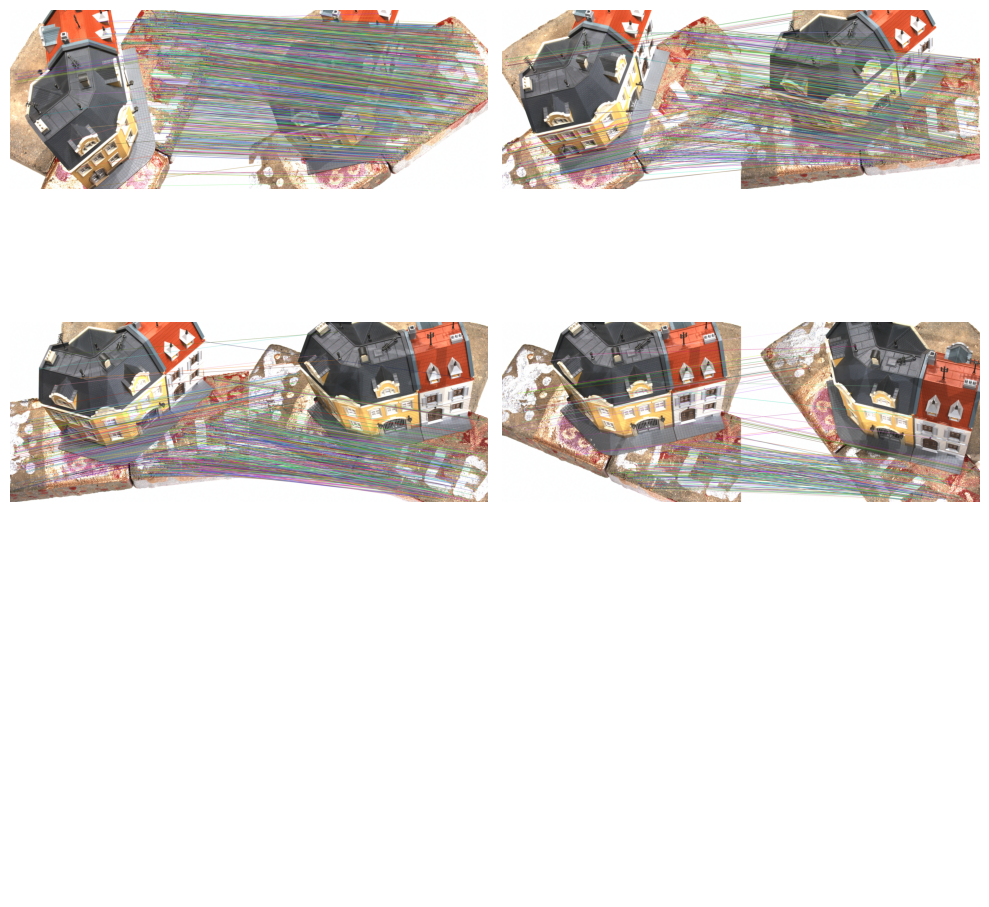

In [351]:
Plot.plot_images_grid(imag_matchs, 3,2, (10,10))

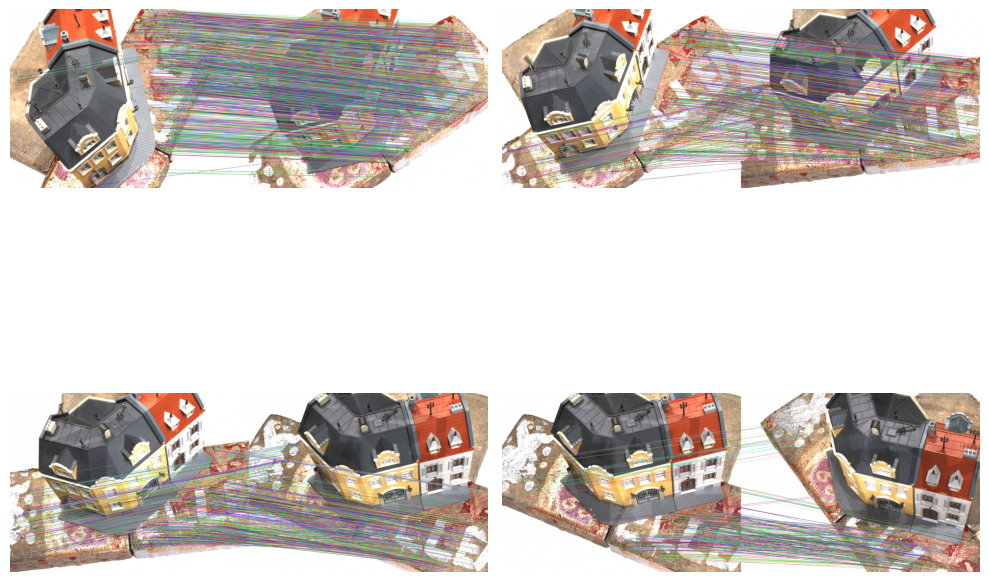

In [352]:
Plot.plot_images_grid(imag_inliers, 2,2, (10,10))

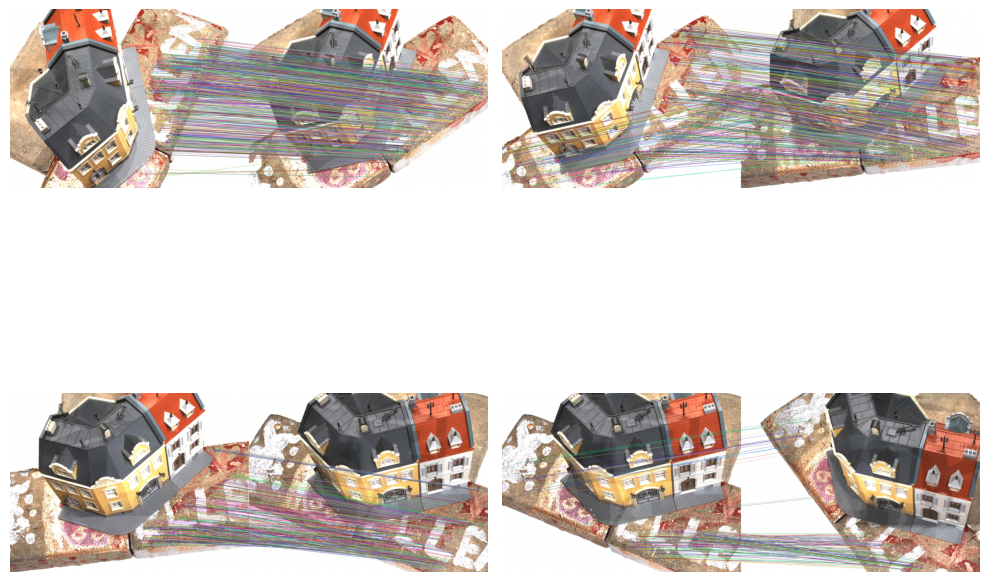

In [353]:
Plot.plot_images_grid(imag_pose_inliers, 2,2, (10,10))

In [354]:
imag_epipolars_1, imag_epipolars_2 = list(zip(*imag_epipolars))

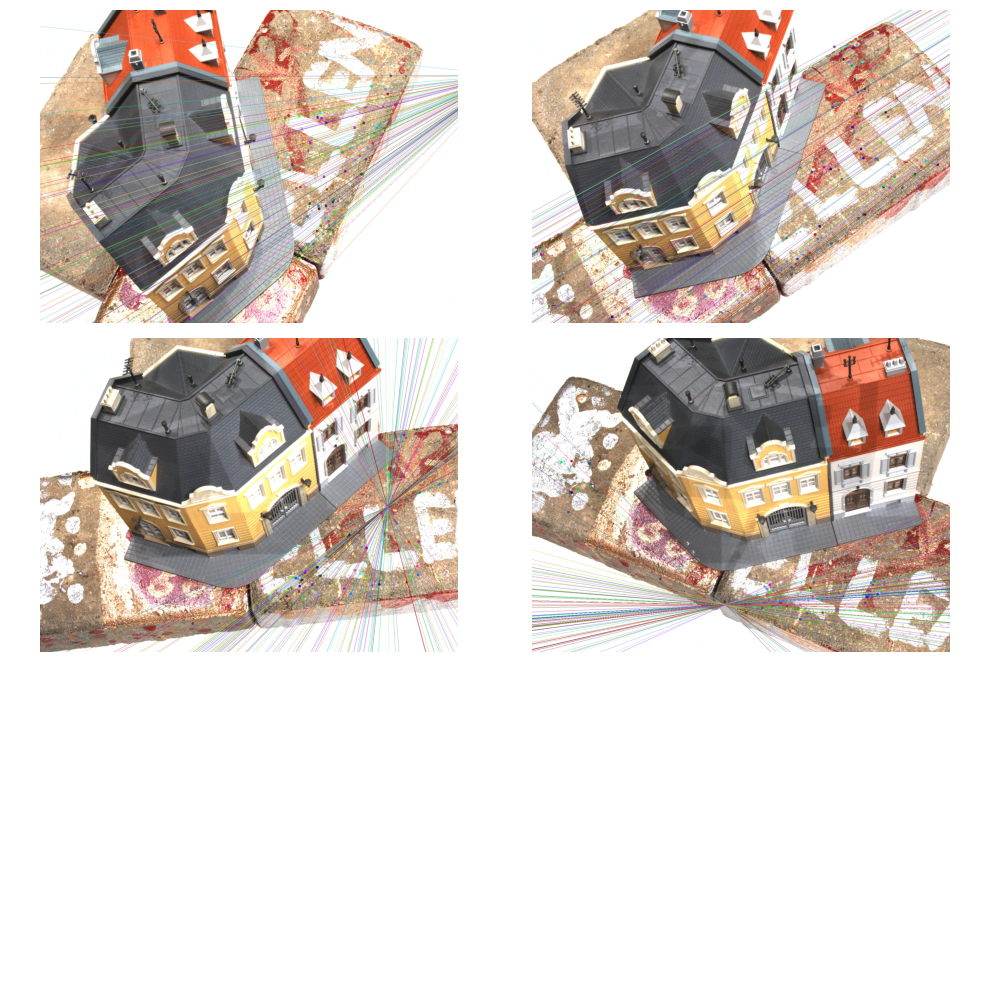

In [355]:
Plot.plot_images_grid(imag_epipolars_1, 3,2, (10,10))

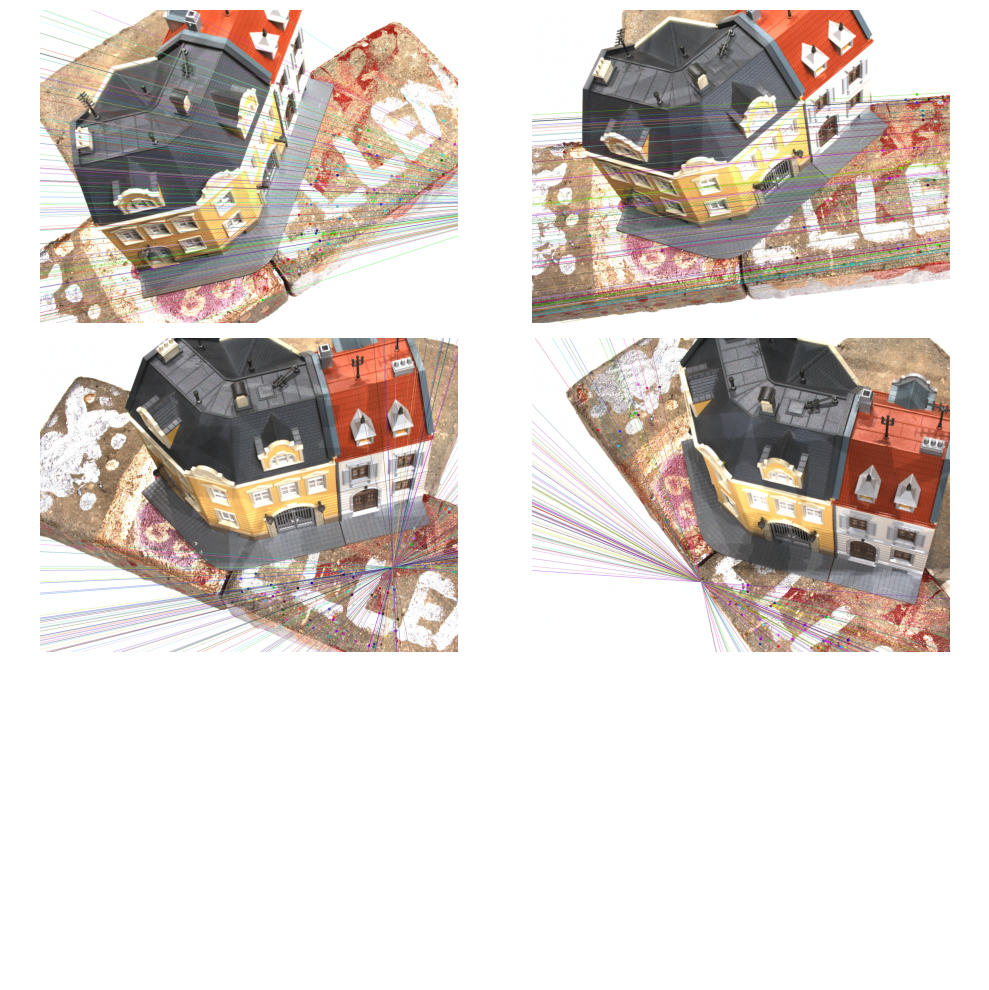

In [356]:
Plot.plot_images_grid(imag_epipolars_2, 3,2, (10,10))

In [376]:
import numpy as np
import cv2

class CalibratedSfM:
    def __init__(self, super_image_pairs, K: np.ndarray):
        """
        super_image_pairs: list of SuperImagePair objects, consecutive pairs
        K: intrinsic camera matrix (same for all images)
        """
        assert len(super_image_pairs) >= 1, "Need at least one image pair"
        self.pairs = super_image_pairs
        self.K = K
        self.num_images = len(super_image_pairs) + 1  # N images, N-1 pairs
        self.Ps = []  # list of 3x4 projection matrices
        self.points_3d = None

    def _build_projection_matrices(self):
        """Build camera projection matrices from R, t and K."""
        self.Ps = []
        # First camera is canonical
        R0 = np.eye(3)
        t0 = np.zeros(3)
        self.Ps.append(self.K @ np.hstack([R0, t0.reshape(3,1)]))

        # Other cameras from SuperImagePair poses
        for pair in self.pairs:
            R, t = pair.R, pair.t
            P = self.K @ np.hstack([R, t.reshape(3,1)])
            self.Ps.append(P)

    def _triangulate_pair(self, P1: np.ndarray, P2: np.ndarray, pair) -> np.ndarray:
        """
        Triangulate points from a SuperImagePair object using pose-inlier matches.
        """
        # Use only pose-inlier matches (more robust)
        matches = pair.inlier_pose_matches
        if matches is None or len(matches) == 0:
            return np.zeros((0,3))
        
        pts1 = np.array([pair.simag1.kpts[m.queryIdx].pt for m in matches]).T
        pts2 = np.array([pair.simag2.kpts[m.trainIdx].pt for m in matches]).T

        points_4d = cv2.triangulatePoints(P1, P2, pts1, pts2)
        points_3d = (points_4d[:3] / points_4d[3]).T

        # Filter points behind the first camera
        in_front = points_3d[:,2] > 0
        points_3d = points_3d[in_front]

        return points_3d

    def run(self):
        """Run calibrated SfM over all pairs and return camera matrices and 3D points."""
        self._build_projection_matrices()
        all_points = []

        for i, pair in enumerate(self.pairs):
            P1 = self.Ps[i]
            P2 = self.Ps[i+1]
            points_3d = self._triangulate_pair(P1, P2, pair)
            if points_3d.shape[0] > 0:
                all_points.append(points_3d)

        # Merge all points
        if all_points:
            self.points_3d = np.vstack(all_points)
        else:
            self.points_3d = np.zeros((0,3))

        return self.Ps, self.points_3d


In [377]:
# def remove_points_behind_cameras(points_3d, Ps):
#     """Remove points that are behind any camera."""
#     filtered_points = []
#     for X in points_3d:
#         in_front = True
#         for P in Ps:
#             R = P[:, :3]
#             t = P[:, 3]
#             X_cam = R @ X + t
#             if X_cam[2] <= 0:  # Z <= 0 => behind camera
#                 in_front = False
#                 break
#         if in_front:
#             filtered_points.append(X)
#     return np.array(filtered_points)

In [378]:
sfm = CalibratedSfM(SIMAGPs, CAMERA.K())
cameras, points_3d = sfm.run()
# points_3d = remove_points_behind_cameras(points_3d, cameras)

In [379]:
def remove_distant_points(points_3d, max_distance_ratio=1.0):
    """
    Remove points that are too far from the centroid.
    
    points_3d: Nx3 array of 3D points
    max_distance_ratio: points farther than max_distance_ratio * std will be removed
    """
    if points_3d.shape[0] == 0:
        return points_3d

    centroid = points_3d.mean(axis=0)
    distances = np.linalg.norm(points_3d - centroid, axis=1)
    std_distance = distances.std()
    mask = distances <= max_distance_ratio * std_distance
    filtered_points = points_3d[mask]
    return filtered_points

In [380]:
points_3d = remove_distant_points(points_3d,  max_distance_ratio=0.5)

In [381]:
import plotly.graph_objects as go
import numpy as np

def plot_sfm_interactive(Ps, points_3d):
    """
    Ps: list of camera projection matrices (3x4)
    points_3d: Nx3 array of 3D points
    """
    # 3D points trace
    pts_trace = go.Scatter3d(
        x=points_3d[:, 0],
        y=points_3d[:, 1],
        z=points_3d[:, 2],
        mode='markers',
        marker=dict(size=3, color='blue'),
        name='Points'
    )

    # Cameras trace
    cam_x, cam_y, cam_z = [], [], []
    cam_labels = []
    first = True
    for i, P in enumerate(Ps):
        if first:
            first = False
            continue
        M = P[:, :3]
        p4 = P[:, 3]
        # Camera center in world coordinates
        C = -np.linalg.inv(M) @ p4
        cam_x.append(C[0])
        cam_y.append(C[1])
        cam_z.append(C[2])
        cam_labels.append(f'Cam {i}')

    cam_trace = go.Scatter3d(
        x=cam_x,
        y=cam_y,
        z=cam_z,
        mode='markers+text',
        marker=dict(size=5, color='red', symbol='diamond'),
        text=cam_labels,
        textposition='top center',
        name='Cameras'
    )

    fig = go.Figure(data=[pts_trace, cam_trace])
    
    # fig = go.Figure(data=[cam_trace])

    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X'),
            yaxis=dict(title='Y'),
            zaxis=dict(title='Z'),
            aspectmode='data'  # keeps scale equal
        ),
        width=1200,
        height=1200
    )

    fig.show()

In [382]:
plot_sfm_interactive(cameras, points_3d)